# Integrate annotated TIL & COLON

## Load adata annotated 

In [1]:
# Libraries
import anndata as ad
import matplotlib as plt
import numpy as np
import pandas as pd
import sc_atlas_helpers as ah
import scanpy as sc
from matplotlib.pyplot import rc_context
from scipy.stats import median_abs_deviation

In [2]:
from functools import partial

import altair as alt

In [3]:
import seaborn as sns

In [4]:
import decoupler as dc

In [22]:
adata = sc.read_h5ad("/data/projects/2021/MicrobialMetabolites/single-cell-sorted-cd8/results/40_gex_surface_prot/13_january_2025/mapped_data/mapped_til_colon.h5ad")

In [23]:
adata.obs.cell_type = adata.obs.cell_type.replace("nan","CD8_NaiveLike")

In [24]:
adata.obs.origin =  adata.obs.origin.replace("colon","normal")

In [25]:
adata.obs.origin =  adata.obs.origin.replace("til","tumor")

In [26]:
adata.obs.condition =  adata.obs.condition.replace("GF-plus","GF")

In [ ]:
adata = sc.read_h5ad("../adata_solo_re_annotated_all.h5ad")

In [ ]:
adata = sc.read_h5ad("../18nov_analysis/adata_solo_18nov_annotation.h5ad")

In [ ]:
adata = adata[~adata.obs["leiden_res0_25"].isin(["5"])]

In [ ]:
adata = sc.read_h5ad("mapped_til_colon.h5ad")

In [ ]:
adata

In [ ]:
adata.obs["origin"] = adata.obs["origin"].replace("colon","Normal")

In [ ]:
adata.obs["origin"] = adata.obs["origin"].replace("til","Tumor")

In [31]:
specific_order = [ "CD8_NaiveLike","CD8_EarlyActiv", "CD8_EffectorMemory", "CD8_Tpex", "CD8_Tex"]  # Replace with your desired order
adata.obs['cell_type'] = pd.Categorical(adata.obs['cell_type'], categories=specific_order, ordered=True)

In [ ]:


sc.pl.umap(
    adata,
    color=[ "cell_type"],  # Add other variables you want to visualize
    legend_fontsize=8,
    frameon=False, save = "cell_type.pdf"
)

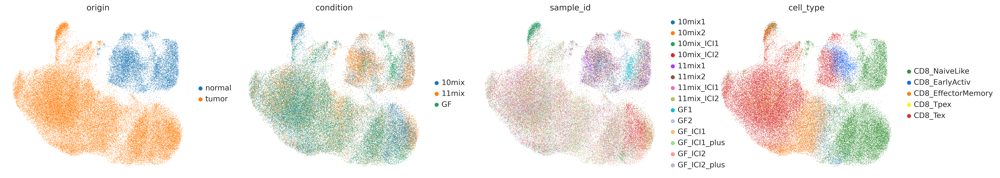

In [35]:
import scanpy as sc
import matplotlib.pyplot as plt
# Visualize
custom_colors = ["#3A923A", "#146aff", "#ff8113", "#fff314", "#D8393A"]  # Example colors

# Add these colors to the `adata_og.uns` dictionary for the `cell_type` category
adata.uns['cell_type_colors'] = custom_colors

plt.rcParams["figure.figsize"] = (6, 5)  # Default Matplotlib size
# Plot UMAP with modified figure size
sc.pl.umap(adata, color=["origin", "condition",  "sample_id","cell_type"], save="_all.pdf")


In [ ]:
specific_order = [ "CD8_NaiveLike", "CD8_EarlyActiv", "CD8_EffectorMemory", "CD8_Tpex","CD8_Tex"]  # Replace with your desired order
adata.obs['cell_type'] = pd.Categorical(adata.obs['cell_type'], categories=specific_order, ordered=True)

In [ ]:
# Visualize
custom_colors = ["#3A923A", "#146aff", "#ff8113", "#fff314", "#D8393A"]  # Example colors

# Add these colors to the `adata_og.uns` dictionary for the `cell_type` category
adata.uns['cell_type_colors'] = custom_colors

sc.pl.umap(
    adata,
    color=[ "cell_type"],  # Add other variables you want to visualize
    legend_fontsize=8,
    frameon=False, save = "cell_type.pdf"
)

In [51]:
adata.obs['cell_type_2'] = adata.obs['cell_type'].astype(str) + "_" + adata.obs['origin'].astype(str)

In [75]:
adata.obs['cell_type_abv'] = adata.obs['cell_type'].astype(str)

In [52]:
annotation_dict = {
    "CD8_Tex_tumor": "CD8_Tex_tumor",
    "CD8_NaiveLike_tumor": "CD8_NaiveLike_tumor",
    "CD8_EffectorMemory_tumor": "CD8_EffectorMemory_tumor",
    "CD8_NaiveLike_normal":"CD8_NaiveLike_normal",
    "CD8_Tex_normal":"CD8_EffectorMemory_normal",
    "CD8_EarlyActiv_normal":"CD8_EffectorMemory_normal",
    "CD8_EarlyActiv_tumor":"CD8_EarlyActiv_tumor",
    "CD8_Tpex_tumor":"CD8_Tpex_tumor",

}
## Add cell type column based on annotation
adata.obs["cell_type_2"] = [
    annotation_dict[clust] for clust in adata.obs["cell_type_2"]
]

In [77]:
annotation_dict = {
    "CD8_Tex": "CD8_Tex",
    "CD8_NaiveLike": "CD8_NL",
    "CD8_EffectorMemory": "CD8_EM",
    "CD8_EarlyActiv":"CD8_EA",
    "CD8_Tpex":"CD8_Tpex"

}
## Add cell type column based on annotation
adata.obs["cell_type_abv"] = [
    annotation_dict[clust] for clust in adata.obs["cell_type_abv"]
]

In [57]:
# Specify the desired order of the categories
desired_order = ["CD8_NaiveLike_normal","CD8_NaiveLike_tumor","CD8_EarlyActiv_tumor","CD8_EffectorMemory_normal","CD8_EffectorMemory_tumor","CD8_Tpex_tumor","CD8_Tex_tumor"]
# Reorder the categories in adata.obs['leiden_res0_25']
adata.obs["cell_type_2"] = pd.Categorical(
    adata.obs["cell_type_2"],
    categories=desired_order,
    ordered=True
)

In [76]:
adata.obs.cell_type.value_counts()

CD8_Tex               27346
CD8_NaiveLike         20286
CD8_EffectorMemory     8219
CD8_EarlyActiv         3513
CD8_Tpex               1095
Name: cell_type, dtype: int64

In [48]:
adata.obs.cell_type_2.value_counts()

CD8_Tex_tumor                24087
CD8_NaiveLike_tumor          14789
CD8_EffectorMemory_tumor      8219
CD8_EffectorMemory_normal     5652
CD8_NaiveLike_normal          5497
CD8_EarlyActiv_tumor          1120
CD8_Tpex_tumor                1095
Name: cell_type_2, dtype: int64

In [44]:
adata.obs.cell_type.value_counts()

CD8_Tex               27346
CD8_NaiveLike         20286
CD8_EffectorMemory     8219
CD8_EarlyActiv         3513
CD8_Tpex               1095
Name: cell_type, dtype: int64

In [79]:
marker_dict_small  = {"CD8_NL":[
    "Ccr7",
"Il7r",
"Sell",
"Tcf7",
"Txk",
"S1pr1",
"Lef1",
"Satb1",
],"CD8_EA":[
"Fosb",
"Gzmm",
"Samd3",
"Cxcr4",
"Btg2"
], "CD8_EM":["Gzma",
"Gzmk",
"Gzmb",
"Ccl5",
],"CD8_Tpex":[
"Xcl1",
"Crtam",
"Ifng",
"Ccl4",
"Dusp4",
"Zeb2",
"Nr4a2",
"Sla",
],"CD8_Tex":["Pdcd1",
"Prf1",
"Havcr2",
] }

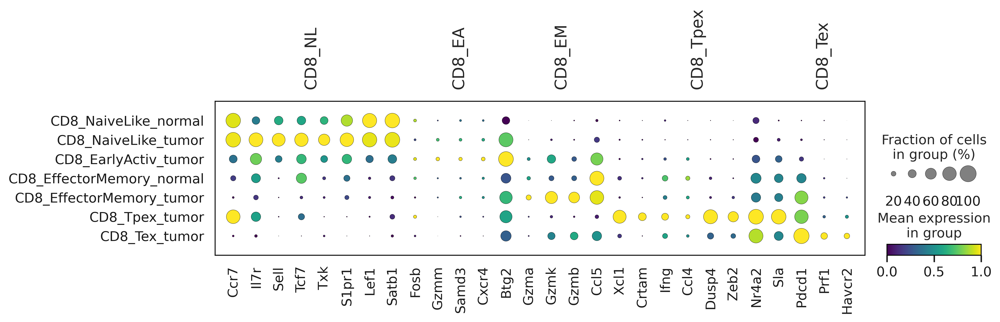

In [93]:
sc.pl.dotplot(adata, marker_dict_small, groupby='cell_type_2',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', cmap = "viridis", save ="mapped_annotation_tumor_normal.pdf")

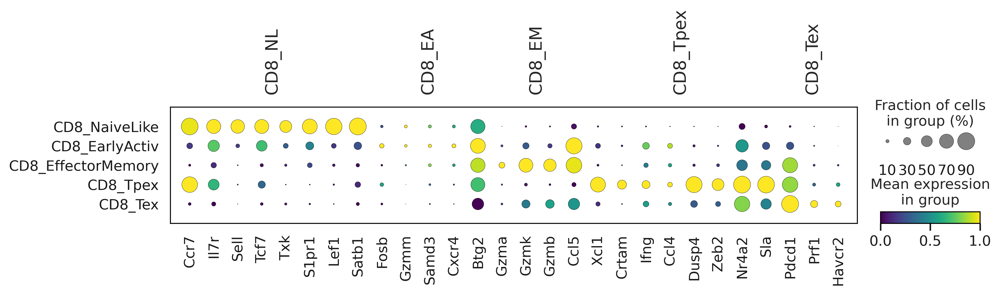

In [87]:
sc.pl.dotplot(adata, marker_dict_small, groupby='cell_type',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', cmap = 'viridis', save ="mapped_annotation.pdf")

In [36]:
marker_dict  = {"CD8_NaiveLike":[
    "Ccr7",
"Il7r",
"Sell",
"Tcf7",
"Txk",
"S1pr1",
"Lef1",
"Satb1",
],"CD8_EffectorMemory":["Gzma",
"Gzmk",
"Nkg7",
"Cd8a",
"Cd8b1",
"Ctsw",
"Gzmb",
"Ccl5",
"Cst7",
"Prf1",
"Abi3",
"Fasl",
"Itm2c",
"1500009L16Rik",
"Eomes",
"Chst12",
"Ccr5",
"Hcst",
"Aoah",
"Hopx",
"Slamf7",
"Cxcr3",
"Oasl1",
"F2r",
"Cxcr6"],"CD8_EarlyActiv":["Gzmk",
"Fos",
"Cd69",
"Zfp36",
"Fosb",
"Ccl5",
"Gzmm",
"Dusp2",
"Lyar",
"Samd3",
"Cxcr4",
"Ctsw",
"Cd8a",
"Anxa1",
"Klrg1",
"Cd8b1",
"Aoah",
"Tagap",
"Klrd1",
"Ier2",
"Gzma",
"Cst7",
"Itm2c",
"Parp8",
"Btg2"], "CD8_Tpex":["Lag3",
"Xcl1",
"Crtam",
"Ifng",
"Ccl4",
"Pdcd1",
"Dusp4",
"Cd8a",
"Zeb2",
"Nr4a2",
"Sla",
"Nkg7",
"Tigit",
"Ctsw",
"Tnfrsf9",
"Tox",
"Lyst",
"Tnfsf4",
"Ccl3",
"Gzmb",
"Rab27a",
"Prf1",
"Cd70",
"Plscr1",],"CD8_Tex":["Lag3",
"Prf1",
"Cd8a",
"Havcr2",
"Gzmb",
"Nkg7",
"Cd8b1",
"Ctsd",
"Klrd1",
"Id2",
"Cst7",
"Pdcd1",
"Tnfrsf9",
"Tigit",
"Ctsw",
"Ccl4",
"Ccl3",
"Ifng",
"Cxcr6",
"Fasl",
"Rbpj",
"Chst12",
"Fam3c",
"Csf1"] }

In [37]:
marker_list  = [
    "Ccr7",
"Il7r",
"Sell",
"Tcf7",
"Txk",
"S1pr1",
"Lef1",
"Satb1",
"Gzma",
"Gzmk",
"Nkg7",
"Cd8a",
"Cd8b1",
"Ctsw",
"Gzmb",
"Ccl5",
"Cst7",
"Prf1",
"Abi3",
"Fasl",
"Itm2c",
"1500009L16Rik",
"Eomes",
"Chst12",
"Ccr5",
"Hcst",
"Aoah",
"Hopx",
"Slamf7",
"Cxcr3",
"Oasl1",
"F2r",
"Cxcr6","Gzmk",
"Fos",
"Cd69",
"Zfp36",
"Fosb",
"Ccl5",
"Gzmm",
"Dusp2",
"Lyar",
"Samd3",
"Cxcr4",
"Ctsw",
"Cd8a",
"Anxa1",
"Klrg1",
"Cd8b1",
"Aoah",
"Tagap",
"Klrd1",
"Ier2",
"Gzma",
"Cst7",
"Itm2c",
"Parp8",
"Btg2","Lag3",
"Xcl1",
"Crtam",
"Ifng",
"Ccl4",
"Pdcd1",
"Dusp4",
"Cd8a",
"Zeb2",
"Nr4a2",
"Sla",
"Nkg7",
"Tigit",
"Ctsw",
"Tnfrsf9",
"Tox",
"Lyst",
"Tnfsf4",
"Ccl3",
"Gzmb",
"Rab27a",
"Prf1",
"Cd70",
"Plscr1","Lag3",
"Prf1",
"Cd8a",
"Havcr2",
"Gzmb",
"Nkg7",
"Cd8b1",
"Ctsd",
"Klrd1",
"Id2",
"Cst7",
"Pdcd1",
"Tnfrsf9",
"Tigit",
"Ctsw",
"Ccl4",
"Ccl3",
"Ifng",
"Cxcr6",
"Fasl",
"Rbpj",
"Chst12",
"Fam3c",
"Csf1"] 

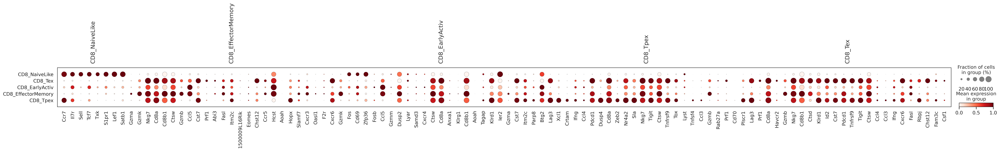

In [30]:
sc.pl.dotplot(adata, marker_dict, groupby='cell_type',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var')#, save ="markers_s41467-021-23324-4.png")

In [ ]:
adata_colon = adata[adata.obs["origin"]=="colon"]

In [ ]:
adata_colon

In [ ]:
#adata_colon.var["gene_symbols"]=adata_colon.var["gene_name"]

In [ ]:
adata_colon.var.set_index("gene_name", inplace=True)

In [ ]:
adata_colon =  adata_colon[~adata_colon.obs["cell_type"].isin(["TIL_DYSFUNCTIONAL","TIL_NAIVE_LIKE","TIL_PRE_DYSFUNCTIONAL"])]

In [ ]:
adata_colon.obs.cell_type.value_counts()

In [ ]:
sc.pp.neighbors(adata_colon, n_neighbors=20)  
sc.tl.leiden(adata_colon, resolution=0.5, flavor="igraph", n_iterations=-1)
sc.tl.paga(adata_colon)
sc.pl.paga(adata_colon, plot=False)
sc.tl.umap(adata_colon, init_pos='paga')


In [ ]:
sc.pl.umap(adata_colon, color=["leiden"])

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Load your AnnData object


# Define the number of rows and columns per page
n_rows = 4
n_cols = 4
plots_per_page = n_rows * n_cols

# Create a single PDF file to save all UMAP plots
output_pdf = "umap_markers_multiple_per_page.pdf"

with PdfPages(output_pdf) as pdf:
    num_markers = len(marker_list)
    num_pages = (num_markers + plots_per_page - 1) // plots_per_page  # Calculate total pages needed

    for page in range(num_pages):
        # Create a new figure for each page
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
        axes = axes.flatten()  # Flatten the grid for easy indexing

        for i in range(plots_per_page):
            marker_idx = page * plots_per_page + i
            if marker_idx >= num_markers:
                axes[i].axis("off")  # Turn off unused axes
                continue

            marker = marker_list[marker_idx]
            if marker in adata.var_names:  # Check if the marker exists
                sc.pl.umap(
                    adata_colon,
                    color=marker,
                    gene_symbols="gene_name",
                    ax=axes[i],
                    show=False,
                    title=marker,
                    cmap="viridis",
                    vmax="p99"
                )
            else:
                axes[i].text(0.5, 0.5, f"'{marker}' not found", 
                             ha="center", va="center", fontsize=12)
                axes[i].axis("off")

        # Adjust layout and save the current page to the PDF
        plt.tight_layout()
        pdf.savefig(fig)
        plt.close(fig)

print(f"UMAP plots saved to '{output_pdf}'.")


In [ ]:
adata_colon.var

In [ ]:
sc.pl.dotplot(adata_colon, marker_dict, groupby='leiden',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', save ="colon_markers_s41467-021-23324-4.png")

In [ ]:
adata_til = adata[adata.obs["origin"]=="til"]

In [ ]:
adata_til =  adata_til[~adata_til.obs["cell_type"].isin(["COLON_DYSFUNCTIONAL","COLON_NAIVE_LIKE"])]

In [ ]:
adata_til.obs.cell_type.value_counts()

In [ ]:
adata_til.var

In [ ]:
sc.pp.neighbors(adata_til, n_neighbors=20)  
sc.tl.leiden(adata_til, resolution=0.5, flavor="igraph", n_iterations=-1)
sc.tl.paga(adata_til)
sc.pl.paga(adata_til, plot=False)
sc.tl.umap(adata_til, init_pos='paga')


In [ ]:
sc.pl.umap(adata_til, color=["leiden"])

In [ ]:
sc.pl.dotplot(adata_til, marker_dict, groupby='leiden',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', save ="til_markers_s41467-021-23324-4.png")

In [ ]:
adata_til.var["gene_symbols"]=adata_til.var["gene_name"]

In [ ]:
adata_til.var.set_index("gene_name", inplace=True)

In [ ]:
import scanpy as sc
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages

# Load your AnnData object
adata = adata_til  # Ensure adata_colon is already loaded

# Define the number of rows and columns per page
n_rows = 4
n_cols = 4
plots_per_page = n_rows * n_cols

# Create a single PDF file to save all UMAP plots
output_pdf = "umap_markers_multiple_per_page.pdf"

with PdfPages(output_pdf) as pdf:
    num_markers = len(marker_list)
    num_pages = (num_markers + plots_per_page - 1) // plots_per_page  # Calculate total pages needed

    for page in range(num_pages):
        # Create a new figure for each page
        fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 5))
        axes = axes.flatten()  # Flatten the grid for easy indexing

        for i in range(plots_per_page):
            marker_idx = page * plots_per_page + i
            if marker_idx >= num_markers:
                axes[i].axis("off")  # Turn off unused axes
                continue

            marker = marker_list[marker_idx]
            if marker in adata.var_names:  # Check if the marker exists
                sc.pl.umap(
                    adata,
                    color=marker,
                    ax=axes[i],
                    show=False,
                    title=marker,
                    cmap="viridis",
                    vmax="p99"
                )
            else:
                axes[i].text(0.5, 0.5, f"'{marker}' not found", 
                             ha="center", va="center", fontsize=12)
                axes[i].axis("off")

        # Adjust layout and save the current page to the PDF
        plt.tight_layout()
        pdf.savefig(fig)
        plt.close(fig)

print(f"UMAP plots saved to '{output_pdf}'.")


In [ ]:
adata_til_exhausted = adata_til[adata_til.obs["leiden"].isin(["0","1","2","3","4"])]

In [ ]:
sc.pp.neighbors(adata_til_exhausted, n_neighbors=20)  
sc.tl.leiden(adata_til_exhausted, resolution=0.5, flavor="igraph", n_iterations=-1)
sc.tl.paga(adata_til_exhausted)
sc.pl.paga(adata_til_exhausted, plot=False)
sc.tl.umap(adata_til_exhausted, init_pos='paga')


In [ ]:
sc.pl.umap(adata_til_exhausted, color=["leiden"])

In [ ]:
adata

In [ ]:
sc.pl.dotplot(adata_til_exhausted, marker_dict, groupby='leiden',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', save ="til_exhausted_markers_s41467-021-23324-4.png")

In [ ]:
sc.pl.umap(adata, color=["Il7r","Ccr7","Tcf7"],gene_symbols="gene_name", vmax="p99", cmap="viridis") #naive like 

In [ ]:
sc.pl.umap(adata, color=["Gzmk"],gene_symbols="gene_name", vmax="p99", cmap="viridis") #predysfuntional

In [ ]:
sc.pl.umap(adata, color=["Klrg1","Prf1","Cx3cr1"],gene_symbols="gene_name", vmax="p99", cmap="viridis") #cytotoxic

In [ ]:
sc.pl.umap(adata, color=["Lag3","Pdcd1","Havcr2","Ctla4"],gene_symbols="gene_name", vmax="p99", cmap="viridis") #dysfuncitonal

In [ ]:
adata_colon = adata[adata.obs["origin"]=="colon"]

In [ ]:
adata_til = adata[adata.obs["origin"]=="til"]

In [ ]:
sc.pl.umap(adata_colon, color=["origin","leiden_res0_25"])

In [ ]:
sc.pl.umap(adata_til, color=["origin","leiden_res0_25"])

In [ ]:
sc.pl.umap(adata_colon, color=["Sell","Cd44","Ccr7","Cd69"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save ="naive_like_colon.png") #naive like 

In [ ]:
sc.pl.umap(adata_colon, color = ["Sell","Cd69","Cd44","Cd28","Itgae","Icos","Cxcr3","Casp3","Pdcd1","Itga4","Cxcr6","Itgae","H2-T23","Cd28"],gene_symbols="gene_name", cmap="viridis")#, save="markers.pdf")

In [ ]:
sc.pl.umap(adata_colon, color=["Il7r","Ccr7","Tcf7"],gene_symbols="gene_name", vmax="p99", cmap="viridis") #naive like 

In [ ]:
sc.pl.umap(adata_colon, color=["Gzmk"],gene_symbols="gene_name", vmax="p99", cmap="viridis") #predysfuntional

In [ ]:
sc.pl.umap(adata_colon, color=["Klrg1","Prf1","Cx3cr1"],gene_symbols="gene_name", vmax="p99", cmap="viridis") #cytotoxic

In [ ]:
sc.pl.umap(adata_colon, color=["Lag3","Pdcd1","Ctla4","Gzmk"],gene_symbols="gene_name", vmax="p99", cmap="viridis",save ="dysfunctional_colon.png") #dysfuncitonal

In [ ]:
adata

In [ ]:
specific_order = [ "N_LIKE", "PRE_DYSF", "DYSF"]  # Replace with your desired order
adata.obs['cell_type'] = pd.Categorical(adata.obs['cell_type'], categories=specific_order, ordered=True)

In [ ]:
sc.pl.umap(adata, color="cell_type",legend_fontsize="small" ,save="umap_new_annotation_abv_legen_side.png")

In [ ]:
annotation_dict = {
    "0": "DYSF",
    "1": "N_LIKE",
    "2": "PRE_DYSF",
    "3": "DYSF",
    "4": "N_LIKE",
    "5": "DYSF",
    "6": "DYSF",
}



In [ ]:
## Add cell type column based on annotation
adata.obs["cell_type"] = [
    annotation_dict[clust] for clust in adata.obs["leiden_res0_25"]
]


# Visualize
sc.pl.umap(
    adata,
    color=["cell_type", "leiden_res0_25"],

    legend_fontsize=8,
)

In [ ]:
sc.pl.umap(adata_til, color=["Sell","Cd44","Il7r","Ccr7","Tcf7"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save ="til_naive_like") #naive like 

In [ ]:
sc.pl.umap(adata_til, color = ["Sell","Cd69","Cd44","Cd28","Itgae","Icos","Cxcr3","Casp3","Pdcd1","Itga4","Cxcr6","Itgae","H2-T23","Cd28"],gene_symbols="gene_name", cmap="viridis")#, save="markers.pdf")

In [ ]:
sc.pl.umap(adata_til, color=["Il7r","Ccr7","Tcf7"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save ="til_naive.png") #naive like 

In [ ]:
sc.pl.umap(adata_til, color=["Sell","Cd44","Ccr7"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save ="til_naive.png") #naive like 

In [ ]:
sc.pl.umap(adata_til, color=["Gzmk","Cd28","Cxcr3"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save ="til_predysfunctional.png") #predysfuntional

In [ ]:
sc.pl.umap(adata_til, color=["Prf1","Cx3cr1","Ifng"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save = "til_cytotoxic.png") #cytotoxic

In [ ]:
sc.pl.umap(adata_til, color=["Lag3","Pdcd1","Havcr2","Ctla4","Icos","Casp3", "Cxcr6"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save ="til_dysfunctional.png") #dysfuncitonal

In [ ]:
sc.pl.umap(adata_til, color=["Lag3","Pdcd1","Ctla4","Gzmk"],gene_symbols="gene_name", vmax="p99", cmap="viridis", save ="til_dysfunctional_same_markers.png") #dysfuncitonal

In [ ]:
sc.pl.umap(adata, color = ["Ifng"],gene_symbols="gene_name", vmax="p99", cmap="Reds")

In [ ]:
annotation_dict = {
    "0": "TIL_EXHAUSTED",
    "1": "TIL_NAIVE",
    "2": "TIL_EM",
    "3": "COLON_RM",
    "4": "COLON_NAIVE",
    "5": "",
    "6": "TIL_EXHAUSTED",
}



In [ ]:
## Add cell type column based on annotation
adata.obs["cell_type"] = [
    annotation_dict[clust] for clust in adata.obs["leiden_res0_25"]
]


# Visualize
sc.pl.umap(
    adata,
    color=["cell_type", "leiden_res0_25"],

    legend_fontsize=8,
)

In [ ]:
sc.pl.umap(
adata,
color=[ "leiden_res0_25","cell_type"],

legend_fontsize=8,
save="cell_type_anno_27nov.png")

In [ ]:
specific_order = [ "COLON_NAIVE", "COLON_RM", "TIL_NAIVE","TIL_EM","TIL_EXHAUSTED",]  # Replace with your desired order
adata.obs['cell_type'] = pd.Categorical(adata.obs['cell_type'], categories=specific_order, ordered=True)

In [ ]:
sc.pl.umap(
    adata,
    color=["origin","sample_id","condition"],

    legend_fontsize=8)#,save="sample_18nov.png"
#)

In [ ]:
sc.tl.diffmap(adata_no5)

In [ ]:
adata

In [ ]:
# Setting root cell as described above
root_ixs = adata_no5.obsm["X_diffmap"][:, 3].argmin()
sc.pl.scatter(
    adata_no5,
    basis="diffmap",
    color=["leiden_res0_25"],
    components=[2, 3],
)

adata.uns["iroot"] = root_ixs

In [ ]:
adata_no5.uns["iroot"] = np.flatnonzero(adata_no5.obs['cell_type'] == 'COLON_NAIVE')[0]


In [ ]:
sc.tl.dpt(adata_no5)

In [ ]:
adata

In [ ]:
sc.pl.scatter(
    adata_no5,
    basis="umap",
    color=["cell_type","dpt_pseudotime"],
    color_map="gnuplot2", save = "pseudotime_no5.png"
)

In [ ]:
adata.uns['iroot'] = np.flatnonzero(adata.obs['cell_type'] == 'COLON_NAIVE')[0]

In [ ]:
sc.tl.dpt(adata)

In [ ]:
    color_map="gnuplot2",

In [ ]:
sc.pl.umap(adata, color=['dpt_pseudotime'], vmax="p99", cmap = "gnuplot2",legend_fontsize=8, save="pseudotime_cell_type.png"  )

In [ ]:
sc.pl.umap(adata, color=['cell_type'], vmax="p99", cmap = "gnuplot2",legend_fontsize=8)#, save="onlycell_type.png"  )

In [ ]:
## paga

In [ ]:
adata.write_h5ad("adata_solo_18nov_annotation.h5ad")

In [ ]:
adata = sc.read_h5ad("adata_solo_18nov_annotation.h5ad")

In [ ]:
adata.obs.columns

In [ ]:
sc.pl.dotplot( adata,
    groupby="sample_id",
    use_raw=False,
    var_names=["Cxcr3"],
    dendrogram=False,
    log=True,
    gene_symbols="gene_name")

In [ ]:
sc.pl.dotplot(
    adata,
    groupby="condition",
    use_raw=False,
    var_names=["Cxcr3"],
    dendrogram=False,
    log=True,
    gene_symbols="gene_name",
)

In [ ]:
adata.obs

In [ ]:
sc.pl.umap(adata, color = "sample_id")

### Functions

In [ ]:
def update_columns_origin(row):

    if "ICI" not in row["sample_id"]:
        row["origin"] = "colon"
    else:
        row["origin"] = "til"

    return row

In [ ]:
def update_columns_batch(row):

    if "ICI1" in row["sample_id"]:
        row["batch_id"] = "ICI1"
    elif "ICI2" in row["sample_id"]:
        row["batch_id"] = "ICI2"
    elif row["sample_id"] == "10mix1":
        row["batch_id"] = "1"
    elif row["sample_id"] == "10mix2":
        row["batch_id"] = "2"

    return row

In [ ]:
def update_columns_condition(row):

    if row["sample_id"] == "10mix1":
        row["condition"] = "10mix"
    elif row["sample_id"] == "10mix2":
        row["condition"] = "10mix"
    elif row["sample_id"] == "11mix1":
        row["condition"] = "11mix"
    elif row["sample_id"] == "11mix2":
        row["condition"] = "11mix"
    elif row["sample_id"] == "GF1":
        row["condition"] = "GF"
    elif row["sample_id"] == "GF2":
        row["condition"] = "GF"
    elif row["sample_id"] == "GF_ICI2_plus":
        row["condition"] = "GF-plus"
    elif row["sample_id"] == "GF_ICI1_plus":
        row["condition"] = "GF-plus"
    elif row["sample_id"] == "GF_ICI2":
        row["condition"] = "GF"
    elif row["sample_id"] == "GF_ICI1":
        row["condition"] = "GF"
    elif row["sample_id"] == "10mix_ICI1":
        row["condition"] = "10mix"
    elif row["sample_id"] == "10mix_ICI2":
        row["condition"] = "10mix"
    elif row["sample_id"] == "11mix_ICI1":
        row["condition"] = "11mix"
    elif row["sample_id"] == "11mix_ICI2":
        row["condition"] = "11mix"

    return row

In [ ]:
# %%
from typing import Dict

import numpy as np
import pandas as pd
from anndata import AnnData


def score_seeds(
    adata: AnnData,
    seed_marker_genes: Dict[str, Dict[str, list]],
    layer: str = "log1p_norm",
    cutoff_sum_pos_marker_expression: float = 0.1,
    cutoff_sum_neg_marker_expression: float = 0,
) -> pd.Series:
    """Label seed cell types based on input pos/neg marker gene expression"""
    
    def _score_ct(adata, seed_marker_genes, layer, cutoff_sum_pos_marker_expression):
        tmp_df = pd.DataFrame(index=adata.obs_names)
        
        for cell_type, markers in seed_marker_genes.items():
            positive_conditions = []
            negative_conditions = []
            
            for positive_markers_list in markers['positive']:
                positive_condition = np.ravel(adata[:, adata.var_names.isin(positive_markers_list)].layers[layer].sum(1)) > cutoff_sum_pos_marker_expression
                positive_conditions.append(positive_condition)
            
            for negative_markers_list in markers['negative']:
                negative_condition = ~(np.ravel(adata[:, adata.var_names.isin(negative_markers_list)].layers[layer].sum(1)) > cutoff_sum_neg_marker_expression)
                negative_conditions.append(negative_condition)
            
            combined_positive_condition = np.all(positive_conditions, axis=0)
            combined_negative_condition = np.all(negative_conditions, axis=0)
            
            condition = combined_positive_condition & combined_negative_condition
            tmp_df[f"tmp_{cell_type}"] = np.where(condition, cell_type, "unknown")
        
        return tmp_df

    
    def _combine_ct(row):
        for ct in seed_ct:
            if row[ct] != 'unknown':
                return row[ct]
        return 'unknown'

    seed_df = _score_ct(adata, seed_marker_genes, layer, cutoff_sum_pos_marker_expression)
    seed_ct = [f"tmp_{ct}" for ct in seed_marker_genes.keys()]
    
    return seed_df.apply(_combine_ct, axis=1)

In [ ]:
set(adata.obs.sample_id)

In [ ]:
def is_outlier(adata, metric: str, nmads: int):
    M = adata.obs[metric]
    outlier = (M < np.median(M) - nmads * median_abs_deviation(M)) | (
        np.median(M) + nmads * median_abs_deviation(M) < M
    )
    return outlier

### Map adata cell type column to adata_solo based on cell barcodes 

In [ ]:
adata_solo.obs["sample_id"] = adata_solo.obs["sample_id"].str.replace("-", "_")

In [ ]:
new_obs_names = adata_solo.obs_names.str.replace(r"-.+", "-1", regex=True)

# Step 2: Concatenate with "_" and adata_solo.obs["sample_id"]
new_obs_names += "_" + adata_solo.obs["sample_id"].astype(str)

# Assign the new values back to adata_solo.obs_names
adata_solo.obs_names = new_obs_names

In [ ]:
cell_type_data = adata.obs["cell_type"]
adata_solo.obs["cell_type"] = adata_solo.obs.index.map(cell_type_data)

In [ ]:
sc.pl.umap(adata_solo, color=["cell_type"], vmax="p99", cmap="Reds")

In [ ]:
# Apply the function to each row in the DataFrame
adata_solo.obs = adata_solo.obs.apply(update_columns_origin, axis=1)

In [ ]:
# Apply the function to each row in the DataFrame
adata_solo.obs = adata_solo.obs.apply(update_columns_batch, axis=1)

In [ ]:
# Apply the function to each row in the DataFrame
adata_solo.obs = adata_solo.obs.apply(update_columns_condition, axis=1)

In [ ]:
sc.pl.umap(adata_solo, color=["cell_type"])

## QC 

In [ ]:
# mitochondrial genes
adata_solo.var["mt"] = adata_solo.var_names.str.startswith("mt-")
# ribosomal genes
adata_solo.var["ribo"] = adata_solo.var_names.str.startswith(("Rps", "Rpl"))

In [ ]:
sc.pp.calculate_qc_metrics(
    adata_solo, qc_vars=["mt", "ribo"], inplace=True, percent_top=[20], log1p=True
)
adata_solo

In [ ]:
adata_solo.var_names_make_unique()

In [ ]:
#adata_solo.var

In [ ]:
#sc.pl.violin(adata_solo, "pct_counts_mt", use_raw=False)

In [ ]:
#sc.pl.violin(adata_solo, "pct_counts_ribo", use_raw=False)

In [ ]:
adata_solo.obs["outlier"] = (
    is_outlier(adata_solo, "log1p_total_counts", 5)
    | is_outlier(adata_solo, "log1p_n_genes_by_counts", 5)
    | is_outlier(adata_solo, "pct_counts_in_top_20_genes", 5)
)
adata_solo.obs.outlier.value_counts()

In [ ]:
adata_solo.obs["mt_outlier"] = is_outlier(adata_solo, "pct_counts_mt", 3) | (
    adata_solo.obs["pct_counts_mt"] > 10
)
adata_solo.obs.mt_outlier.value_counts()

In [ ]:
adata_solo.obs["ribo_outlier"] = is_outlier(adata_solo, "pct_counts_ribo", 3) | (
    adata_solo.obs["pct_counts_ribo"] > 15
)
adata_solo.obs.mt_outlier.value_counts()

In [ ]:
print(f"Total number of cells: {adata_solo.n_obs}")
adata_solo = adata_solo[(~adata_solo.obs.outlier) & (~adata_solo.obs.mt_outlier)].copy()

print(f"Number of cells after filtering of low quality cells: {adata_solo.n_obs}")

In [ ]:
print(f"Total number of cells: {adata_solo.n_obs}")
adata_solo = adata_solo[
    (~adata_solo.obs.outlier) & (~adata_solo.obs.ribo_outlier)
].copy()

print(f"Number of cells after filtering of low quality cells: {adata_solo.n_obs}")

In [ ]:
#sc.pl.violin(adata_solo, "pct_counts_mt", use_raw=False)

In [ ]:
#sc.pl.violin(adata_solo, "pct_counts_ribo", use_raw=False)

In [ ]:
adata_solo.var["ribo"] = adata_solo.var_names.str.startswith(("Rps", "Rpl"))

In [ ]:
# adata_solo.var.ribo.value_counts()

In [ ]:
adata_solo = adata_solo[:, adata_solo.var["ribo"] == False].copy()

In [ ]:
adata_solo.var["mt"] = adata_solo.var_names.str.startswith(("mt-", "mt-"))

In [ ]:
# adata_solo.var.mt.value_counts()

In [ ]:
adata_solo = adata_solo[:, adata_solo.var["mt"] == False].copy()

In [ ]:
# Visualize
# adata_solo
#sc.pl.umap(
#    adata_solo,
#    color=["pct_counts_mt", "total_counts", "n_genes_by_counts"],
#    vmax="p99",
#    cmap="inferno",
#)

In [ ]:
#sc.tl.rank_genes_groups(adata_solo, "leiden", method="wilcoxon")

In [ ]:
#pd.DataFrame(adata_solo.uns["rank_genes_groups"]["names"]).head(20)

In [ ]:
#sc.pl.highest_expr_genes(adata_solo, n_top=40, gene_symbols="gene_name")

### Split adata

In [ ]:
adata_solo.var.index = adata_solo.var["ensembl_id"]

In [ ]:
adata_solo_til = adata_solo[adata_solo.obs["origin"] == "til"]

In [ ]:
#sc.tl.rank_genes_groups(adata_solo_til, "cell_type", method="wilcoxon")

In [ ]:
#pd.DataFrame(adata_solo_til.uns["rank_genes_groups"]["names"]).head(20)

In [ ]:
#sc.pl.highest_expr_genes(adata_solo_til, n_top=20, gene_symbols="gene_name")

In [ ]:
adata_solo_colon = adata_solo[adata_solo.obs["origin"] == "colon"]

### Annotate colon

In [ ]:
sc.pl.umap(adata_solo_colon, color=["condition", "sample_id", "leiden"])

In [ ]:
#sc.tl.rank_genes_groups(adata_solo_colon, "leiden", method="wilcoxon")

In [ ]:
#pd.DataFrame(adata_solo_colon.uns["rank_genes_groups"]["names"]).head(20)

In [ ]:
adata_solo_colon.var["ribo"] = adata_solo_colon.var_names.str.startswith(("Rps", "Rpl"))

In [ ]:
adata_solo_colon = adata_solo_colon[:, adata_solo_colon.var["ribo"] == False].copy()

In [ ]:
sc.pp.neighbors(adata_solo_colon, n_neighbors=10)
sc.tl.leiden(adata_solo_colon, resolution=0.5, n_iterations=-1)

In [ ]:
#sc.pl.umap(adata_solo_colon, color=["leiden"], vmax="p99", cmap="Reds")

In [ ]:
markers = {
    "Naive": ["Lef1", "Sell", "Ccr7", "Tcf7","Il7r"],
    "Effector M.": ["Gzmk", "Cxcr4", "Cxcr3", "Cd44"], # Predysfunctional
    "Exhausted": ["Havcr2", "Pdcd1", "Ifng", "Itgae","Lag3","Ctla4"], # Dysfunctional
    "Cytotoxic": ["Cx3cr1", "Klrg1", "Prf1"],
}

In [ ]:
sc.pl.dotplot(
    adata_solo_colon,
    groupby="leiden",
    use_raw=False,
    var_names=markers,
    dendrogram=False,
    log=True,
    gene_symbols="gene_name",
)


In [ ]:
sc.pl.umap(
    adata_solo_colon,
    color=[
        "Lef1",
        "Sell",
        "Ccr7",
        "Tcf7",
        "Gzmk",
        "Cxcr4",
        "Cxcr3",
        "Cd44",
        "Havcr2",
        "Pdcd1",
        "Ifng",
        "Itgae",
        "Cx3cr1",
        "Klrg1",
        "Prf1",
        "Mki67",
        "Ccl5",
        "H2-K1",
        "H2-Q4",
        "H2-Q7",
    ],
    vmax="p99",
    cmap="Reds",
    add_outline=True,
)

In [ ]:
sc.pl.umap(
    adata_solo_colon, color=["leiden"], vmax="p99", cmap="Reds", legend_loc="on data"
)

In [ ]:
annotation_dict = {
    "0": "COLON_Exhausted",
    "1": "COLON_Exhausted",
    "2": "COLON_Naive",
    "3": "COLON_Naive",
    "4": "COLON_Naive",
    "5": "COLON_Exhausted",
    "6": "COLON_Intermediate",
    "7": "COLON_Exhausted",
    "8": "COLON_Naive",
    "9": "COLON_Exhausted",
}



In [ ]:
## Add cell type column based on annotation
adata_solo_colon.obs["cell_type"] = [
    annotation_dict[clust] for clust in adata_solo_colon.obs["leiden"]
]
# Visualize
sc.pl.umap(
    adata_solo_colon,
    color=["cell_type", "leiden"],

    legend_fontsize=8,
)

In [ ]:
#sc.tl.rank_genes_groups(adata_solo_colon, "cell_type", method="wilcoxon")

In [ ]:
#pd.DataFrame(adata_solo_colon.uns["rank_genes_groups"]["names"]).head(20)

## Exhausted subtypes

In [ ]:
adata_solo_colon_ex = adata_solo_colon[
    adata_solo_colon.obs["cell_type"] == "COLON_Exhausted"
]

In [ ]:
sc.pp.neighbors(adata_solo_colon_ex, n_neighbors=10)
sc.tl.leiden(adata_solo_colon_ex, resolution=0.3, n_iterations=-1)

In [ ]:
sc.pl.umap(
    adata_solo_colon_ex,
    color=["Il7r","Ccr7","Ifng","Tbx21","Lag3","Cxcr6","Gzmb","Gzmk"],
    vmax="p99",
    cmap="Reds",
    add_outline=True,
)

In [ ]:
sc.pl.umap(adata_solo_colon_ex, color=["leiden"], vmax="p99")

In [ ]:
#sc.tl.rank_genes_groups(adata_solo_colon_ex, "leiden", method="wilcoxon")

In [ ]:
#pd.DataFrame(adata_solo_colon_ex.uns["rank_genes_groups"]["names"]).head(20)

In [ ]:
annotation_dict = {
    "0": "COLON_Exhausted",
    "1": "COLON_Infg",  # Ifng
    "2": "COLON_Exhausted",
    "3": "COLON_Exhausted",
    "4": "COLON_Exhausted",
}


In [ ]:
## Add cell type column based on annotation
adata_solo_colon_ex.obs["cell_type"] = [
    annotation_dict[clust] for clust in adata_solo_colon_ex.obs["leiden"]
]
# Visualize
sc.pl.umap(
    adata_solo_colon_ex,
    color=["cell_type", "leiden"],

    legend_fontsize=8,
)

### Reintegrate annotated subsets

In [ ]:
adata_solo_colon_rest = adata_solo_colon[
    adata_solo_colon.obs["cell_type"].isin(["COLON_Naive","COLON_Intermediate"])
]

In [ ]:
# Visualize
sc.pl.umap(
    adata_solo_colon_rest,
    color=["cell_type", "leiden"],

    legend_fontsize=8,
)

In [ ]:
adata_solo_colon.obs["cell_type"] = adata_solo_colon.obs["cell_type"].astype("str")#
adata_solo_colon.obs.loc[adata_solo_colon_ex.obs.index, "cell_type"] = adata_solo_colon_ex.obs["cell_type"].astype("str")

In [ ]:
adata_solo_colon.obs["cell_type"] = adata_solo_colon.obs["cell_type"].astype("str")#
adata_solo_colon.obs.loc[adata_solo_colon_rest.obs.index, "cell_type"] = adata_solo_colon_rest.obs["cell_type"].astype("str")

In [ ]:
# Visualize
sc.pl.umap(
    adata_solo_colon,
    color=["cell_type", "leiden"],

    legend_fontsize=8,
)

In [ ]:
markers = {
    "Naive": ["Lef1", "Sell", "Ccr7"],
    "Effector M.": ["Gzmk", "Cxcr4", "Cxcr3", "Cd44"], # Predysfunctional
    "Exhausted": ["Pdcd1", "Ifng", "Itgae","Lag3","Ctla4"], # Dysfunctional
}

In [ ]:
sc.pl.dotplot(
    adata_solo_colon,
    groupby="cell_type",
    use_raw=False,
    var_names=markers,
    dendrogram=False,
    categories_order = [ 'COLON_Naive',"COLON_Intermediate","COLON_Infg","COLON_Exhausted"],
    log=True,
    gene_symbols="gene_name",
)


## Reintegrate with adata_solo til & colon

In [ ]:
adata_solo.obs["cell_type"] = adata_solo.obs["cell_type"].astype("str")#
adata_solo.obs.loc[adata_solo_colon.obs.index, "cell_type"] = adata_solo_colon.obs["cell_type"].astype("str")

In [ ]:
set(adata_solo.obs["cell_type"])

In [ ]:
# Visualize
sc.pl.umap(
    adata_solo,
    color=["cell_type"], legend_loc="on data", legend_fontsize=7,

)

In [ ]:
# Visualize
sc.pl.umap(
    adata_solo,
    color=["cell_type"],groups=['COLON_Naive',"COLON_Intermediate","COLON_Infg","COLON_Exhausted"],
legend_loc="on data", legend_fontsize=7,

)

In [ ]:
# Visualize
sc.pl.umap(
    adata_solo,
    color=["cell_type"],groups=['MPEC_Effector',
 'MPEC_Intermediate',
 'MPEC_Progenitor',
 'SLEC_Effector',
 'SLEC_Inf',
 'SLEC_Intermediate',
 'SLEC_Plastic',
 'SLEC_Progenitor',
 'SLEC_Terminal'],legend_loc="on data", legend_fontsize=7,

)

In [ ]:
## Annotated unknown cells 

In [ ]:
# Apply the function to each row in the DataFrame
adata.obs = adata.obs.apply(update_columns_origin, axis=1)

In [ ]:
# Apply the function to each row in the DataFrame
adata.obs = adata.obs.apply(update_columns_batch, axis=1)

In [ ]:
# Apply the function to each row in the DataFrame
adata.obs = adata.obs.apply(update_columns_condition, axis=1)

In [ ]:
adata.obs

In [ ]:
adata_u = adata[adata.obs["cell_type"]=="nan"]

In [ ]:
adata_u

In [ ]:
sc.pl.umap(adata_u, color=["cell_type","leiden","origin"])

In [ ]:
sc.pl.umap(adata, color=["cell_type","origin","leiden"], legend_loc="on data", legend_fontsize=7)

In [ ]:
markers = {
    "Early A.": ["Cd69"],
    "Late A.": ["Il2ra"],
        "Naive": ["Sell"],
        "E.Memory": ["Cd44"],

       "MPEC": ["Il7r"],#Memory Precursor Effector Cells
       "SLEC": ["Klrg1","Tbx21"], #Short Lived Effector Cells
 
    "Exhaustion":["Havcr2","Entpd1","Tox"],
    "Cytotoxic":["Gzmb","Gzmk","Ifng"],
    "Sel-renewal":["Cxcr3","Casp3"],
    }

In [ ]:
sc.pl.dotplot(adata_u, groupby="leiden",var_names=markers, dendrogram=False,log=True, gene_symbols="gene_name")

In [ ]:
marker_list = ["Cd69","Il2ra","Sell","Cd44","Il7r","Klrg1","Tbx21","Havcr2","Entpd1","Tox","Gzmb","Gzmk","Ifng","Cxcr3","Casp3"]

In [ ]:
sc.pl.umap(
    adata_u,
    color=marker_list,
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
sc.pl.umap(
    adata_u,
    color=["Ifng","Cxcr3"],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
sc.pl.umap(
    adata_u,
    color=["Tox","Casp3"],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
sc.pl.umap(
    adata,
    color=["cell_type"],groups=['MPEC_Effector',
 'MPEC_Intermediate',
 'MPEC_Progenitor',
],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
sc.pl.umap(
    adata,
    color=["cell_type"],groups=[ 'SLEC_Effector',
 'SLEC_Inf',
 'SLEC_Intermediate',
 'SLEC_Plastic',
 'SLEC_Progenitor',
 'SLEC_Terminal'
],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
sc.pl.umap(adata_u, color=["leiden"])

In [ ]:
sc.pp.neighbors(adata_u, n_neighbors=10)
sc.tl.leiden(adata_u, resolution=0.5,  n_iterations=-1)
sc.tl.umap(adata_u)

In [ ]:
sc.pl.umap(adata_u, color=["leiden"])

In [ ]:
sc.pl.dotplot(adata_u, groupby="leiden",var_names=markers, dendrogram=False,log=True, gene_symbols="gene_name")

In [ ]:
marker_list = ["Cd69","Il2ra","Sell","Cd44","Il7r","Klrg1","Tbx21","Havcr2","Entpd1","Tox","Gzmb","Gzmk","Ifng","Cxcr3","Casp3"]

In [ ]:
sc.pl.umap(
    adata_u,
    color=marker_list,
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
sc.pl.umap(
    adata_u,
    color=["Ifng","Cxcr3"],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
sc.pl.umap(
    adata_u,
    color=["Tox","Casp3"],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
annotation_dict = {
    '0':'MPEC_Effector',
    '1':'SLEC_Terminal',
    '2':'MPEC_Effector',
    '3':'SLEC_Effector',
    '4':'SLEC_Terminal',
    '5':'SLEC_Effector',
    '6':"MPEC_Effector",
    "7":"SLEC_Terminal",
    "8":"SLEC_Plastic"
  }

In [ ]:
## Add cell type column based on annotation
adata_u.obs['cell_type'] = [annotation_dict[clust] for clust in adata_u.obs['leiden']]

# Visualize
sc.pl.umap(adata_u, color='cell_type')

In [ ]:
sc.pl.dotplot(adata_u, groupby="cell_type",var_names=markers, dendrogram=False,log=True, gene_symbols="gene_name")

In [ ]:
adata.obs["cell_type"] = adata.obs["cell_type"].astype("str")
adata.obs.loc[adata_u.obs.index, "cell_type"] = adata_u.obs["cell_type"].astype("str")

In [ ]:
sc.pl.umap(
    adata,
    color=["cell_type"],groups=[ 'SLEC_Effector',
 'SLEC_Inf',
 'SLEC_Intermediate',
 'SLEC_Plastic',
 'SLEC_Progenitor',
 'SLEC_Terminal','MPEC_Effector',
 'MPEC_Intermediate',
 'MPEC_Progenitor',
],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_name"
)

In [ ]:
adata.obs.cell_type.value_counts()

In [ ]:
set(adata.obs.cell_type)

In [ ]:
#adata.write_h5ad("adata_solo_annotated_all.h5ad")

## Create gene counts and samplesheet for DS analysis

In [ ]:
adata.var

In [ ]:
adata.var.rename(columns={"gene_name": "gene_id"}, inplace=True)

In [ ]:
adata.raw = None

In [ ]:
path = "/data/scratch/kvalem/projects/2021/honda_microbial_metabolites_2021/40_tables/40_single-cell-sorted-cd8/40_gex_surface_prot"

In [ ]:
### Samplesheet
samplesheet = adata.obs.copy()
#samplesheet["sample_id"]=samplesheet.index
samplesheet.reset_index(inplace=True)

In [ ]:
samplesheet.to_csv(f"{path}/samplesheet.csv", index=False)
samplesheet.to_csv(f"{path}/samplesheet.tsv", index=False, sep = "\t")

In [ ]:
bulk_df = adata.to_df().T

In [ ]:
### Raw counts
bulk_df = adata.to_df().T
bulk_df["gene_id"]=bulk_df.index
bulk_df.columns = bulk_df.columns.str.replace("[.-]", "_").str.replace(" ", "_")

In [ ]:
bulk_df.to_csv(f"{path}/counts.csv")

In [ ]:
scales_counts = sc.pp.normalize_total(adata, target_sum=None, inplace=False)
# log1p transform
adata.layers["log1p_norm"] = sc.pp.log1p(scales_counts["X"], copy=True)

In [ ]:
sc.pp.log1p()

In [ ]:
### log1p_norm counts
adata_log1p_norm = pd.DataFrame(adata.layers["log1p_norm"], 
    adata.to_df().index, 
    adata.to_df().columns)
bulk_df = adata_log1p_norm.T
bulk_df["gene_id"]=bulk_df.index
bulk_df.columns = bulk_df.columns.str.replace("[.-]", "_").str.replace(" ", "_")
bulk_df.to_csv(f"{path}/log1p_norm_counts.csv")   

## Cells expressing Ifng , Cxcr3, 

In [ ]:
adata.obs["cell_type_seed"] = score_seeds(
    adata,
    {
        "Interferon": {
            "positive": [['Ifng']],
            "negative": [[""]],
        },
        "Cxcr3": {
            "positive": [['Cxcr3']],
            "negative": [[""]],
        }
   },
    cutoff_sum_pos_marker_expression=0.25,
)

In [ ]:
adata.obs.cell_type_seed

In [ ]:
adata.obs.cell_type_seed.value_counts()

In [ ]:
sc.pl.umap(adata, color="cell_type_seed", groups="Interferon")

In [ ]:
sc.pl.umap(
    adata,
    color=["cell_type_seed"],
    cmap="Reds",
    frameon=False,add_outline=True, vmax="p99", gene_symbols="gene_id"
)

## Highest expressed genes

In [ ]:
adata

In [ ]:
sc.tl.rank_genes_groups(
    adata, groupby="leiden", method="wilcoxon", key_added="dea_leiden"
)

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden", standard_scale="var", n_genes=5, key="dea_leiden",gene_symbols="gene_name"
)

In [ ]:
sc.tl.rank_genes_groups(
    adata, groupby="cell_type", method="wilcoxon", key_added="dea_cell_type"
)

In [ ]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="cell_type", standard_scale="var", n_genes=5, key="dea_cell_type",gene_symbols="gene_name", cmap="seismic")#, save="rank_genes_groups_dotplot")


In [ ]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden", standard_scale="var", n_genes=5, key="dea_cell_type",gene_symbols="gene_name", cmap="seismic")#, save="rank_genes_groups_dotplot")


In [ ]:
adata.obs.cell_type

In [ ]:
adata.var.set_index= "gene_name"

In [ ]:
sc.tl.rank_genes_groups(adata, "leiden",  method="wilcoxon", gene_symbols="gene_name")

In [ ]:
adata_colon = adata[adata.obs["origin"]=="colon"]

In [ ]:
adata_til = adata[adata.obs["origin"]=="til"]

In [ ]:
sc.pl.highest_expr_genes(adata_colon, n_top=20,gene_symbols="gene_name")

In [ ]:
sc.pl.highest_expr_genes(adata_til, n_top=20,gene_symbols="gene_name")

In [ ]:
adata_11mix = adata[adata.obs["condition"]=="11mix"]

In [ ]:
adata10mix = adata[adata.obs["condition"]=="10mix"]

In [ ]:
adataGF= adata[adata.obs["condition"]=="GF"]

In [ ]:
adata.obs["condition"].value_counts()

In [ ]:
adataGFplus= adata[adata.obs["condition"]=="GF-plus"]

In [ ]:
sc.pl.highest_expr_genes(adata_11mix, n_top=20,gene_symbols="gene_name")

In [ ]:
sc.pl.highest_expr_genes(adata10mix, n_top=20,gene_symbols="gene_name")

In [ ]:
sc.pl.highest_expr_genes(adataGF, n_top=20,gene_symbols="gene_name")

In [ ]:
sc.pl.highest_expr_genes(adataGFplus, n_top=20,gene_symbols="gene_name")


## Treg exploration

In [ ]:
adata = sc.read_h5ad("adata_solo_18nov_annotation.h5ad")

In [ ]:
sc.pl.umap(
    adata,
    color=["origin","sample_id","condition","cell_type"],
    legend_fontsize=8,save="umap_new_anno.png"
)

In [ ]:
sc.pl.umap(adata, color=['cell_type'], vmax="p99", cmap = "gnuplot2",legend_fontsize=8)#, save="onlycell_type.png"  )

In [ ]:
sc.pl.umap(adata, color = ["Foxp3","Il2rb","H2-T23","Ptprc","Cd28"],gene_symbols="gene_name", vmax="p99", cmap="Reds")

In [ ]:
adata

In [ ]:
sc.pl.umap(adata, color="leiden_res0_25")

In [ ]:
annotation_dict = {
    "0": "TIL_DYSFUNCTIONAL",
    "1": "TIL_NAIVE_LIKE",
    "2": "TIL_PRE_DYSFUNCTIONAL",
    "3": "COLON_DYSFUNCTIONAL",
    "4": "COLON_NAIVE_LIKE",
    "5": "TIL_DYSFUNCTIONAL",
    "6": "TIL_DYSFUNCTIONAL",
}



In [ ]:
## Add cell type column based on annotation
adata.obs["cell_type"] = [
    annotation_dict[clust] for clust in adata.obs["leiden_res0_25"]
]


# Visualize
sc.pl.umap(
    adata,
    color=["cell_type", "leiden_res0_25"],

    legend_fontsize=8,
)

In [ ]:
markers = ["Sell","Cd44","Il7r","Ccr7","Tcf7","Gzmk","Cd28","Cxcr3","Prf1","Cx3cr1","Ifng","Lag3","Pdcd1","Havcr2","Ctla4","Icos","Casp3", "Cxcr6"]

In [ ]:
# t memory

sc.pl.matrixplot(adata, markers, groupby='cell_type',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', save ="new_annotation_abvr")

In [ ]:
specific_order = [ "COLON_NAIVE_LIKE", "COLON_DYSFUNCTIONAL", "TIL_NAIVE_LIKE", "TIL_PRE_DYSFUNCTIONAL","TIL_DYSFUNCTIONAL"]  # Replace with your desired order
adata.obs['cell_type'] = pd.Categorical(adata.obs['cell_type'], categories=specific_order, ordered=True)

In [ ]:
# t memory

sc.pl.matrixplot(adata, markers, groupby='cell_type',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', save ="new_annotation.png")

In [ ]:
# t memory

sc.pl.dotplot(adata, markers, groupby='cell_type',gene_symbols="gene_name",dendrogram=False,  standard_scale ='var', save ="new_annotation.png")

In [ ]:
adata.write_h5ad("adata_solo_18nov_annotation.h5ad")